In [ ]:
# pip install --upgrade pip

In [ ]:
# pip install tensorflow

In [ ]:
import tensorflow
from tensorflow.keras.preprocessing import image
from tensorflow.keras.layers import GlobalMaxPooling2D
from tensorflow.keras.applications.resnet50 import ResNet50,preprocess_input
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
import numpy as np
from numpy.linalg import norm
import os
from tqdm import tqdm
import pickle
import pandas as pd
from io import BytesIO
from PIL import Image
from urllib import request

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Microsoft Engage/myntra.csv')


In [ ]:
data.head()

,Unnamed: 0,product_id,size,brand,dominant_material,title,actual_color,dominant_color,product_type,body,...,complete_the_look,variant_price,variant_compare_at_price,ideal_for,inventory,specifications,img1,img3,img2,img4
0,0,6658,XS,Global Desi,viscose,Global Desi Women Red & Pink Printed Tunic,Pink | Red,Red,Tunic,"Red and Pink printed Tunic, has a round neck, ...",...,Taking the bright colours of summer and nature...,1799,1799,Women,,Occasion : Ethnic | Main Trend : New Basics | ...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...
1,1,476,34,Jaipur Kurti,cotton,Jaipur Kurti Women Blue Printed Maxi Flared S...,Blue,Blue,Maxi Flared Skirt,"Blue woven printed maxi flared skirt, has an e...",...,Elevate your style quotient with this maxi ski...,873,2299,Women,15,Knit or Woven : Woven | Transparency : Opaque ...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...
2,2,3804,M,20Dresses,Viscose Rayon,20Dresses Women Black & Blue Printed Maxi Dress,Black | Blue,Black,Maxi Dress,"Black and blue printed woven maxi dress, has a...",...,Set the tone for this season with this one-of-...,1516,1895,Women,Knit or Woven : Woven | Transparency : Opaque ...,NaN,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...
3,3,7300,Onesize,9rasa,Cotton,9rasa Black Block Print Palazzos,Black,Black,Palazzos,"Black block print mid-rise palazzo trousers, h...",...,The latest range of palazzo trousers from 9ras...,1299,1299,Women,,Pattern : Printed | Transparency : Opaque | Bo...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...
4,4,3312,1-2Y,A.T.U.N All Things Uber Nice,polyester,A.T.U.N All Things Uber Nice Girls Mustard Yel...,Yellow | Maroon | Mustard,Mustard,Lehenga Choli with Dupatta,Mustard yellow and maroon lehenga choli with d...,...,Give your little princess the style and fabulo...,1199,2999,Girls,Dupatta Fabric : Net | Occasion : Festive | Nu...,NaN,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...


In [ ]:
url = data['img1'].iloc[15]
url = url + "?tr=w-224,h-224"
url

'http://assets.myntassets.com/v1/assets/images/2066774/2017/9/7/11504787369636-AKKRITI-BY-PANTALOONS-Women-Skirts-9441504787369484-1.jpg?tr=w-224,h-224'

http://assets.myntassets.com/v1/assets/images/2066774/2017/9/7/11504787369636-AKKRITI-BY-PANTALOONS-Women-Skirts-9441504787369484-1.jpg?tr=w-224,h-224
b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x02\x00H\x00H\x00\x00\xff\xe2\x02\x1cICC_PROFILE\x00\x01\x01\x00\x00\x02\x0clcms\x02\x10\x00\x00mntrRGB XYZ \x07\xdc\x00\x01\x00\x19\x00\x03\x00)\x009acspAPPL\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xd6\x00\x01\x00\x00\x00\x00\xd3-lcms\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\ndesc\x00\x00\x00\xfc\x00\x00\x00^cprt\x00\x00\x01\\\x00\x00\x00\x0bwtpt\x00\x00\x01h\x00\x00\x00\x14bkpt\x00\x00\x01|\x00\x00\x00\x14rXYZ\x00\x00\x01\x90\x00\x00\x00\x14gXYZ\x00\x00\x01\xa4\x00\x00\x00\x14bXYZ\x00\x00\x01\xb8\x00\x00\x00\x14rTRC\x00\x00\x01\xcc\x00\x00\x00@gTRC\x00\x00\x01\xcc\x00\x00\x00@bTRC\x

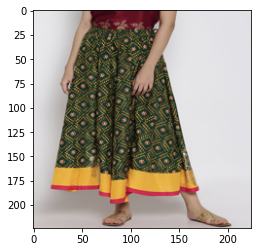

In [ ]:
import matplotlib.pyplot as plt
from io import BytesIO
from PIL import Image
from urllib import request

print(url)
res = request.urlopen(url).read()
print(res)
img = Image.open(BytesIO(res)).resize((224,224))
print(img)
plt.imshow(img)

In [ ]:
img_array = image.img_to_array(img)
img_array.shape

(224, 224, 3)

In [ ]:
expanded_img_array = np.expand_dims(img, axis=0)

expanded_img_array.shape

(1, 224, 224, 3)

In [ ]:
preprocessed_img = preprocess_input(expanded_img_array)
preprocessed_img.shape

(1, 224, 224, 3)

In [ ]:
model = ResNet50(weights='imagenet',include_top=False,input_shape=(224,224,3))
model.trainable = False

94781440/94765736 [==============================] - 1s 0us/step


In [ ]:
model = tensorflow.keras.Sequential([
    model,
    GlobalMaxPooling2D()
])


In [ ]:
vgg = VGG16(include_top=False,
    weights="imagenet",
    
    input_shape=(224,224,3))
vgg.output

58900480/58889256 [==============================] - 0s 0us/step


<KerasTensor: shape=(None, 7, 7, 512) dtype=float32 (created by layer 'block5_pool')>

In [ ]:
for layer in vgg.layers:
  layer.trainabe = False

In [ ]:
vgg_model = tensorflow.keras.Sequential([
    vgg,
    GlobalMaxPooling2D()
])


In [ ]:
images = []

for i in range(data.shape[0]):
  images.append(data['img1'].iloc[i])

print(images[0])

In [ ]:
vgg_feature_list = []
for url in tqdm(images):
  res = request.urlopen(url).read()
  img = Image.open(BytesIO(res)).resize((224,224))
  img_array = image.img_to_array(img)
  # print(img_array)
  expanded_img_array = np.expand_dims(img_array, axis=0)
  preprocessed_img = preprocess_input(expanded_img_array)

  result = vgg_model.predict(preprocessed_img).flatten()
  
  normalized_result = result / norm(result)
  vgg_feature_list.append(normalized_result)

100%|██████████| 7432/7432 [1:36:14<00:00,  1.29it/s]


In [ ]:
pickle.dump(vgg_feature_list,open('vgg.pkl','wb'))


In [ ]:
vgg_feature_list

[array([8.93084519e-03, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        1.11167571e-02, 6.05186261e-03, 3.45164463e-02, 8.91257729e-03,
        8.98857117e-02, 2.38541234e-02, 7.43074119e-02, 0.00000000e+00,
        5.77165112e-02, 0.00000000e+00, 2.07584128e-02, 2.55767051e-02,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 8.12131613e-02,
        0.00000000e+00, 6.45745322e-02, 0.00000000e+00, 1.57680467e-01,
        3.86283211e-02, 1.65954186e-03, 7.09230825e-02, 7.86342844e-02,
        1.49753550e-02, 0.00000000e+00, 6.73062503e-02, 0.00000000e+00,
        1.88210141e-02, 4.12434004e-02, 1.68773551e-02, 3.93254030e-03,
        0.00000000e+00, 2.71872636e-02, 0.00000000e+00, 0.00000000e+00,
        2.23813150e-02, 4.31461483e-02, 9.54176113e-02, 1.36427626e-01,
        0.00000000e+00, 0.00000000e+00, 5.37033714e-02, 4.27598692e-02,
        0.00000000e+00, 0.00000000e+00, 8.48893747e-02, 2.30131373e-02,
        2.34713871e-02, 1.80662039e-03, 6.04891144e-02, 2.924258

In [ ]:
result = model.predict(preprocessed_img).flatten()
result.shape

(100352,)

In [ ]:
normalized_result = result / norm(result)

In [ ]:
images = []

for i in range(data.shape[0]):
  images.append(data['img1'].iloc[i])

print(images[0])

http://assets.myntassets.com/v1/assets/images/10247017/2019/7/19/89db9fec-b898-4ce0-bd4b-e84095b2154e1563516226861-Global-Desi-Women-Tunics-4441563516225272-1.jpg


In [ ]:
# Function for feature extractor

def extract_features(url,model):
    # img = image.load_img(img_path,target_size=(224,224))
    res = request.urlopen(url).read()
    img = Image.open(BytesIO(res)).resize((224,224))
    img_array = image.img_to_array(img)
    print(img_array)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_img = preprocess_input(expanded_img_array)
    result = model.predict(preprocessed_img).flatten()
    normalized_result = result / norm(result)

    return normalized_result

In [ ]:
# for img in tqdm(images):
#   print(img)

In [ ]:
feature_list = []
for url in tqdm(images):
  res = request.urlopen(url).read()
  img = Image.open(BytesIO(res)).resize((224,224))
  img_array = image.img_to_array(img)
  # print(img_array)
  expanded_img_array = np.expand_dims(img_array, axis=0)
  preprocessed_img = preprocess_input(expanded_img_array)
  result = model.predict(preprocessed_img).flatten()
  normalized_result = result / norm(result)
  feature_list.append(normalized_result)



100%|██████████| 7432/7432 [2:17:13<00:00,  1.11s/it]


In [ ]:
# get all product image features
print(feature_list)

[array([0.01195276, 0.00517246, 0.        , ..., 0.01598416, 0.02338316,
       0.0504062 ], dtype=float32), array([0.0188465 , 0.00672224, 0.00700524, ..., 0.01095124, 0.01995936,
       0.08813206], dtype=float32), array([0.0290595 , 0.02415782, 0.00484176, ..., 0.00855079, 0.01106471,
       0.07657982], dtype=float32), array([0.03639975, 0.00274554, 0.        , ..., 0.00568414, 0.        ,
       0.03287354], dtype=float32), array([0.0077353 , 0.03828261, 0.00048689, ..., 0.00066402, 0.01652215,
       0.03855811], dtype=float32), array([0.00590597, 0.00397631, 0.00500135, ..., 0.01346995, 0.02072037,
       0.04207366], dtype=float32), array([0.00242226, 0.01115603, 0.00087775, ..., 0.0131052 , 0.02475013,
       0.02145599], dtype=float32), array([0.02214944, 0.01205429, 0.00368688, ..., 0.02323752, 0.00215418,
       0.05695125], dtype=float32), array([0.01503018, 0.02515899, 0.        , ..., 0.02081313, 0.01951902,
       0.02242831], dtype=float32), array([0.01195765, 0.000389

In [ ]:
pickle.dump(feature_list,open('embeddings.pkl','wb'))
# pickle.dump(images,open('images.pkl','wb'))